In [1]:
from google.colab import drive
drive.mount('/content/mydrive')

Mounted at /content/mydrive


In [2]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://www.orfonline.org/wp-content/uploads/2016/09/Terrorism-1280x720.jpg")

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
import plotly.express as px
import plotly.tools as tls
import plotly.figure_factory as ff

pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings('ignore')

In [32]:
col_list = ['iyear', 'imonth','iday','extended','provstate','latitude','longitude','specificity','vicinity','crit1','crit2','crit3','doubtterr',
'multiple', 'natlty1','propextent','ishostkid','ransom','country','city','gname','individual','nkillus','nkillter','nwound','nwoundus',
'nwoundte','property','targtype1','suicide','success','weaptype1','region','region_txt','attacktype1','attacktype1_txt', 'nkill', 'country_txt']

df=pd.read_csv('/content/mydrive/MyDrive/Colab Notebooks 2/Terrorist Prediction/Global Terrorist.csv', usecols=col_list, encoding='ISO-8859-1')
df.head()

,iyear,imonth,iday,extended,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,crit1,crit2,crit3,doubtterr,multiple,success,suicide,attacktype1,attacktype1_txt,targtype1,natlty1,gname,individual,weaptype1,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,ishostkid,ransom
0,1970,7,2,0,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,1,1,1,0.0,0.0,1,0,1,Assassination,14,58.0,MANO-D,0,13,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,0.0,0.0
1,1970,0,0,0,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,1,1,1,0.0,0.0,1,0,6,Hostage Taking (Kidnapping),7,21.0,23rd of September Communist League,0,13,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,1.0,1.0
2,1970,1,0,0,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,1,1,1,0.0,0.0,1,0,1,Assassination,10,217.0,Unknown,0,13,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,0.0,0.0
3,1970,1,0,0,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,1,1,1,0.0,0.0,1,0,3,Bombing/Explosion,7,217.0,Unknown,0,6,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,0.0,0.0
4,1970,1,0,0,101,Japan,4,East Asia,Fukouka,Fukouka,33.580412,130.396361,1.0,0,1,1,1,-9.0,0.0,1,0,7,Facility/Infrastructure Attack,7,217.0,Unknown,0,8,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,0.0,0.0


In [33]:
df.shape

(181691, 38)

In [34]:
df.describe(include='O')

,country_txt,region_txt,provstate,city,attacktype1_txt,gname
count,181691,181691,181270,181257,181691,181691
unique,205,12,2855,36674,9,3537
top,Iraq,Middle East & North Africa,Baghdad,Unknown,Bombing/Explosion,Unknown
freq,24636,50474,7645,9775,88255,82782


In [35]:
df.describe(include='int')

,iyear,imonth,iday,extended,country,region,vicinity,crit1,crit2,crit3,success,suicide,attacktype1,targtype1,individual,weaptype1,property
count,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,0.068297,0.988530,0.993093,0.875668,0.889598,0.036507,3.247547,8.439719,0.002950,6.447325,-0.544556
std,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,0.284553,0.106483,0.082823,0.329961,0.313391,0.187549,1.915772,6.653838,0.054234,2.173435,3.122889
min,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,-9.000000
25%,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,3.000000,0.000000,5.000000,0.000000
50%,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,4.000000,0.000000,6.000000,1.000000
75%,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,14.000000,0.000000,6.000000,1.000000
max,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.000000,22.000000,1.000000,13.000000,1.000000


**Missing value**

In [36]:
feature_with_nan=[feature for feature in df.columns if df[feature].isnull().sum()>1]

for feature in feature_with_nan:
  print(feature, np.round(df[feature].isnull().sum()/df.shape[0] * 100,3),'%Missing Value')

provstate 0.232 %Missing Value
city 0.239 %Missing Value
latitude 2.508 %Missing Value
longitude 2.508 %Missing Value
specificity 0.003 %Missing Value
natlty1 0.858 %Missing Value
nkill 5.676 %Missing Value
nkillus 35.47 %Missing Value
nkillter 36.853 %Missing Value
nwound 8.977 %Missing Value
nwoundus 35.611 %Missing Value
nwoundte 38.055 %Missing Value
propextent 64.74 %Missing Value
ishostkid 0.098 %Missing Value
ransom 57.411 %Missing Value


In [37]:
df[feature_with_nan].head()

,provstate,city,latitude,longitude,specificity,natlty1,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,propextent,ishostkid,ransom
0,NaN,Santo Domingo,18.456792,-69.951164,1.0,58.0,1.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0
1,Federal,Mexico city,19.371887,-99.086624,1.0,21.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,1.0,1.0
2,Tarlac,Unknown,15.478598,120.599741,4.0,217.0,1.0,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0
3,Attica,Athens,37.997490,23.762728,1.0,217.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,Fukouka,Fukouka,33.580412,130.396361,1.0,217.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


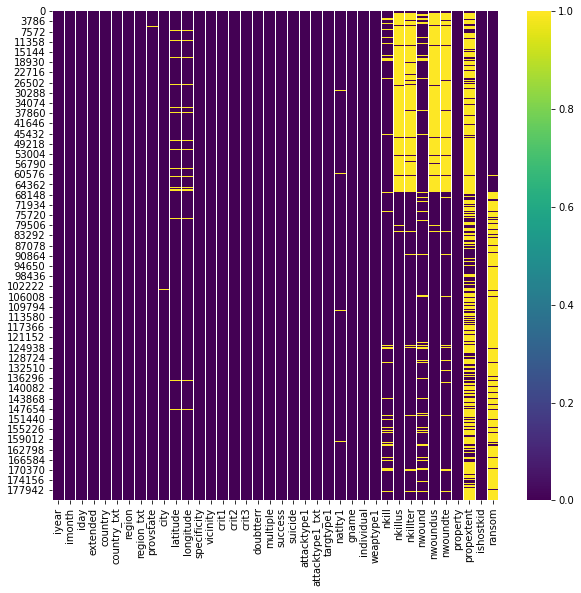

In [38]:
plt.figure(figsize=(10,9))
sns.heatmap(df.isnull(), cmap='viridis')

In [39]:
percent_missing=df[feature_with_nan].isnull().sum()*100/len(df)
missing_value_df=pd.DataFrame({'columns_name':df[feature_with_nan].columns,
                            'percent_missing':percent_missing})
missing_value_df.sort_values('percent_missing',inplace=True)
missing_value_df

,columns_name,percent_missing
specificity,specificity,0.003302
ishostkid,ishostkid,0.097969
provstate,provstate,0.231712
city,city,0.238867
natlty1,natlty1,0.858050
latitude,latitude,2.507554
longitude,longitude,2.508104
nkill,nkill,5.676120
nwound,nwound,8.977330
nkillus,nkillus,35.470111


**Numerical Columnes**

In [40]:
numerical_columns=[feature for feature in df.columns if df[feature].dtypes != object and len(df[feature].unique()) <= 50]

print('Number of Numerical Feature:', len(numerical_columns))

df[numerical_columns].head()

Number of Numerical Feature: 25


,iyear,imonth,iday,extended,region,specificity,vicinity,crit1,crit2,crit3,doubtterr,multiple,success,suicide,attacktype1,targtype1,individual,weaptype1,nkillus,nwoundus,nwoundte,property,propextent,ishostkid,ransom
0,1970,7,2,0,2,1.0,0,1,1,1,0.0,0.0,1,0,1,14,0,13,NaN,NaN,NaN,0,NaN,0.0,0.0
1,1970,0,0,0,1,1.0,0,1,1,1,0.0,0.0,1,0,6,7,0,13,NaN,NaN,NaN,0,NaN,1.0,1.0
2,1970,1,0,0,5,4.0,0,1,1,1,0.0,0.0,1,0,1,10,0,13,NaN,NaN,NaN,0,NaN,0.0,0.0
3,1970,1,0,0,8,1.0,0,1,1,1,0.0,0.0,1,0,3,7,0,6,NaN,NaN,NaN,1,NaN,0.0,0.0
4,1970,1,0,0,4,1.0,0,1,1,1,-9.0,0.0,1,0,7,7,0,8,NaN,NaN,NaN,1,NaN,0.0,0.0


In [41]:
df[numerical_columns].suicide.value_counts()

0    175058
1      6633
Name: suicide, dtype: int64

**Categorical Columns**

In [42]:
categorical_columns=[feature for feature in df.columns if df[feature].dtypes == object and len(df[feature].unique()) <= 50]

print('Number of Categorical Feature:', len(categorical_columns))

df[categorical_columns].head()

Number of Categorical Feature: 2


,region_txt,attacktype1_txt
0,Central America & Caribbean,Assassination
1,North America,Hostage Taking (Kidnapping)
2,Southeast Asia,Assassination
3,Western Europe,Bombing/Explosion
4,East Asia,Facility/Infrastructure Attack


**Checking the Descriptive Stats of the Dataset**

In [43]:
print('Country with the most attacks:',df['country_txt'].value_counts().idxmax())
print('City with the most attacks:'  ,df['city'].value_counts().index[1]) # AS Frist Entry Unknown
print("Region with the most attacks:",df['region_txt'].value_counts().idxmax())
print('Year with the most attacks: ' ,df['iyear'].value_counts().idxmax())
print('Month with the most attacks: ',df['imonth'].value_counts().idxmax(), '(May)')
print('Group with the most attacks: ',df['gname'].value_counts().index[1])
print('Most Attack Types:',df['attacktype1_txt'].value_counts().idxmax())

Country with the most attacks: Iraq
City with the most attacks: Baghdad
Region with the most attacks: Middle East & North Africa
Year with the most attacks:  2014
Month with the most attacks:  5 (May)
Group with the most attacks:  Taliban
Most Attack Types: Bombing/Explosion


**Number of Terrorist Activities Each Year**

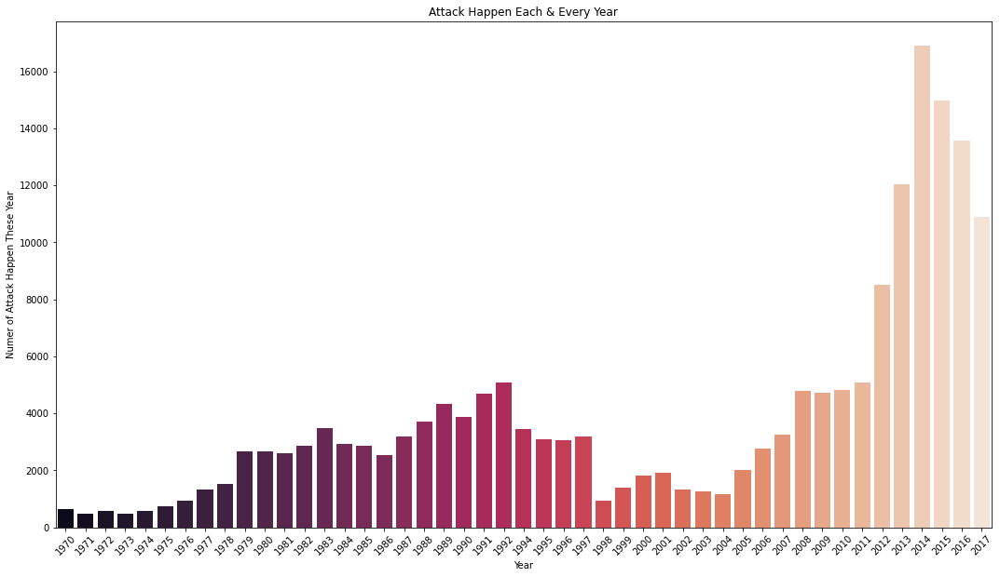

In [45]:
x=df['iyear'].unique()
y=df['iyear'].value_counts(dropna=False).sort_index()

plt.figure(figsize=(18,10))
sns.barplot(x=x, y=y, palette='rocket')

plt.xticks(rotation=45)
plt.xlabel('Year')
plt.ylabel('Numer of Attack Happen These Year')
plt.title('Attack Happen Each & Every Year')
plt.show()

**Terrorist Activities by Region in each Year through Area Plot**

In [46]:
df.region = df['region'].replace({ 1 : 'North America',
                                  2 : 'Central America and Caribbean',
                                  3 : 'South America',
                                  4 : 'East Asia',
                                  5 : 'Southeast Asia',
                                  6 : 'South Asia',
                                  7 : 'Central Asia',
                                  8 : 'Western Europe',
                                  9 : 'Eastern Europe',
                                  10 : 'The Middle East and North Africa',
                                  11 : 'Sub-Saharan Africa',
                                  12 : 'Australasia and Oceania'
    
})

df.attacktype1 = df['attacktype1'].replace({1 : 'Assassination',
                                            2 : 'Armed assault',
                                            3 :  'Bombing/explosion',
                                            4 : 'Hijacking',
                                            5 : 'Hostage taking (barricade incident)',
                                            6 : 'Hostage taking (kidnapping)',
                                            7 : 'Facility/infrastructure attack',
                                            8 : 'Unarmed assaults',
                                            9 : 'Unknown'
})

In [47]:
fig = px.scatter(df, x='region', y='attacktype1',color='iyear') # Added color to previous basic 

fig.update_layout(title= 'TERRORIST ACTIVITIES BY REGION IN EACH YEAR',xaxis_title="REGION",yaxis_title="ATTACK TYPE")

fig.show()

**Create New Column Casualitie**

In [50]:
df['nwound']=df['nwound'].fillna(0).astype(int)
df['nkill']=df['nkill'].fillna(0).astype(int)
df['casualities']=df['nwound'] + df['nkill']

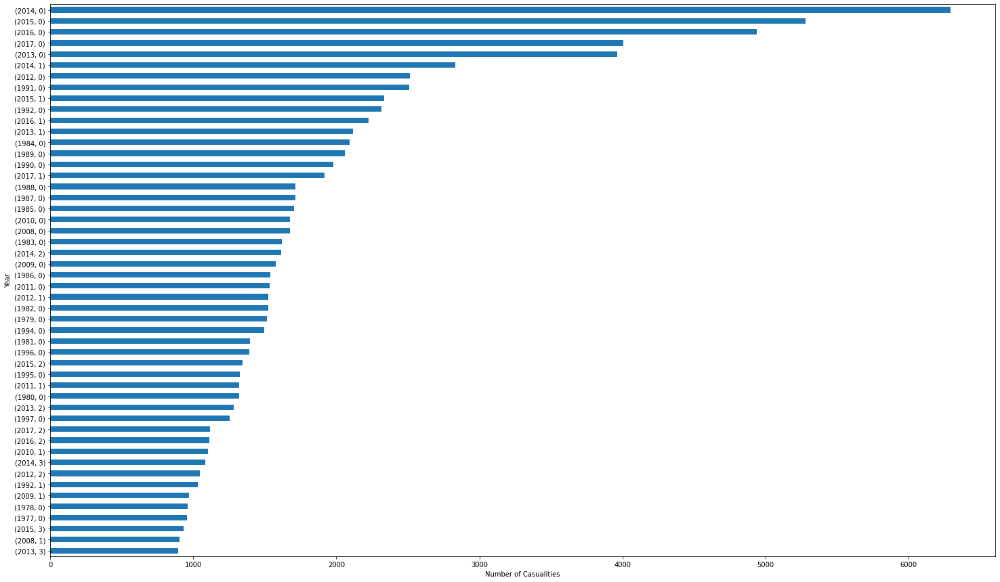

In [52]:
plt.figure(figsize=(25,15))
df.groupby('iyear')['casualities'].value_counts().nlargest(50).sort_values(ascending=True).plot(kind='barh')
plt.xlabel('Number of Casualities')
plt.ylabel('Year')
plt.show()

**Top 40 Worst Terror Attacks**

In [53]:
top_country=df.sort_values(by='casualities',ascending=False)[:40]
country=top_country.pivot_table(index='country_txt', columns='iyear', values='casualities')
country.fillna(0,inplace=True)
country.head()

iyear,1982,1984,1992,1994,1995,1996,1997,1998,2001,2004,2005,2006,2007,2008,2009,2014,2015,2016,2017
country_txt,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,536.0,0.0,584.0
Chad,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1161.0,0.0,0.0,0.0,0.0,0.0
Ethiopia,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,520.0,0.0
India,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1005.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [54]:
colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap = go.Heatmap(z=country.values, x=country.columns, y=country.index, colorscale=colorscale)
data = [heatmap]

layout = go.Layout(
    title='Top 40 Worst Terror Attacks in History from 1982 to 2016',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='') )

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap',show_link=False)

**Top Countries affected by Terrorist Attacks**

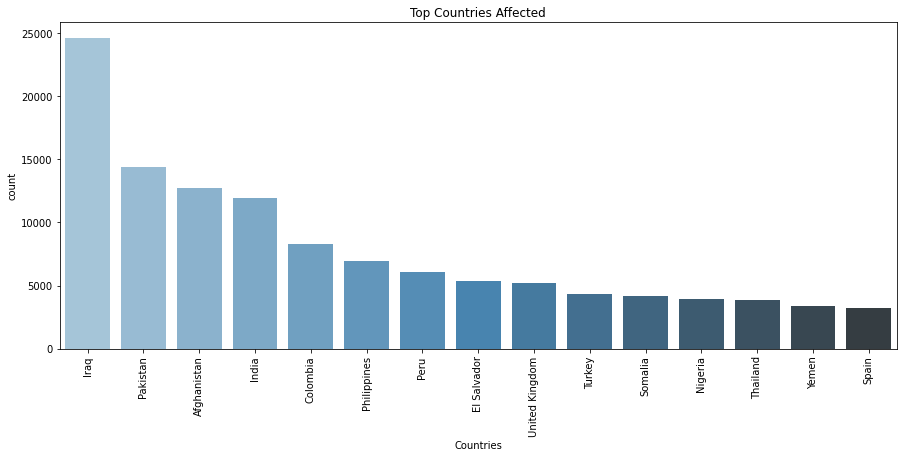

In [56]:
plt.figure(figsize=(15,6))
sns.barplot(df['country_txt'].value_counts()[:15].index, df['country_txt'].value_counts()[:15].values,palette='Blues_d')
plt.title('Top Countries Affected')
plt.xlabel('Countries')
plt.ylabel('count')
plt.xticks(rotation=90)
plt.show()

In [57]:
# Total Number of people killed in terror attack
killData = df.loc[:,'nkill']
print('Number of people killed by terror attack:', int(sum(killData.dropna())))# drop the NaN values


Number of people killed by terror attack: 411868


In [58]:
# Let's look at what types of attacks these deaths were made of.
attackData = df.loc[:,'attacktype1']
# attackData
typeKillData = pd.concat([attackData, killData], axis=1)

In [59]:
typeKillFormatData = typeKillData.pivot_table(columns='attacktype1', values='nkill', aggfunc='sum')
typeKillFormatData

attacktype1,Armed assault,Assassination,Bombing/explosion,Facility/infrastructure attack,Hijacking,Hostage taking (barricade incident),Hostage taking (kidnapping),Unarmed assaults,Unknown
nkill,160297,24920,157321,3642,3718,4478,24231,880,32381


In [60]:
#Number of Killed in Terrorist Attacks by Countries
countryData = df.loc[:,'country_txt']
# countyData
countryKillData = pd.concat([countryData, killData], axis=1)

In [61]:
countryKillFormatData = countryKillData.pivot_table(columns='country_txt', values='nkill', aggfunc='sum')
countryKillFormatData

country_txt,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia-Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Costa Rica,Croatia,Cuba,Cyprus,Czech Republic,Czechoslovakia,Democratic Republic of the Congo,Denmark,Djibouti,Dominica,Dominican Republic,East Germany (GDR),East Timor,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Ethiopia,Falkland Islands,Fiji,Finland,France,French Guiana,French Polynesia,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guadeloupe,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,International,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macau,Macedonia,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Martinique,Mauritania,Mauritius,Mexico,Moldova,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Caledonia,New Hebrides,New Zealand,Nicaragua,Niger,Nigeria,North Korea,North Yemen,Norway,Pakistan,Panama,Papua New Guinea,Paraguay,People's Republic of the Congo,Peru,Philippines,Poland,Portugal,Qatar,Republic of the Congo,Rhodesia,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Serbia-Montenegro,Seychelles,Sierra Leone,Singapore,Slovak Republic,Slovenia,Solomon Islands,Somalia,South Africa,South Korea,South Sudan,South Vietnam,South Yemen,Soviet Union,Spain,Sri Lanka,St. Kitts and Nevis,St. Lucia,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Vanuatu,Vatican City,Venezuela,Vietnam,Wallis and Futuna,West Bank and Gaza Strip,West Germany (FRG),Western Sahara,Yemen,Yugoslavia,Zaire,Zambia,Zimbabwe
nkill,39384,42,11066,0,3043,0,490,37,23,30,258,1,44,1244,76,14,79,3,0,9,42,79,11,203,0,28,134,4205,543,2347,365,1990,1119,228,1008,14698,1,17,248,8,45,6,27,4069,5,274,3,34,2,9,54,3869,12053,2,46,3,1765,0,8,11,534,1,0,6,13,278,84,19,325,9,8,5167,213,17,41,336,307,4,6,0,19341,1238,1,1673,78589,117,1703,420,268,42,66,133,39,1948,83,63,10,27,2,4061,46,177,2598,1,0,1,49,31,33,152,20,1432,5,0,43,0,780,13,1,292,2711,1280,220,1969,37,35,0,1,10598,1474,22682,3,3,79,23822,38,79,59,15,12771,9559,9,32,7,182,217,4,4308,3236,672,325,3,3,0,840,5,7,1,4,10273,2674,10,2634,81,0,96,1288,15530,0,2,3883,29,6,22,74,15229,60,307,73,2742,76,6,351,6888,3,3065,2261,123,3410,3771,6,68,0,0,227,1,0,1500,97,1,8776,119,324,70,154


In [62]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=25
fig_size[1]=25
plt.rcParams["figure.figsize"] = fig_size

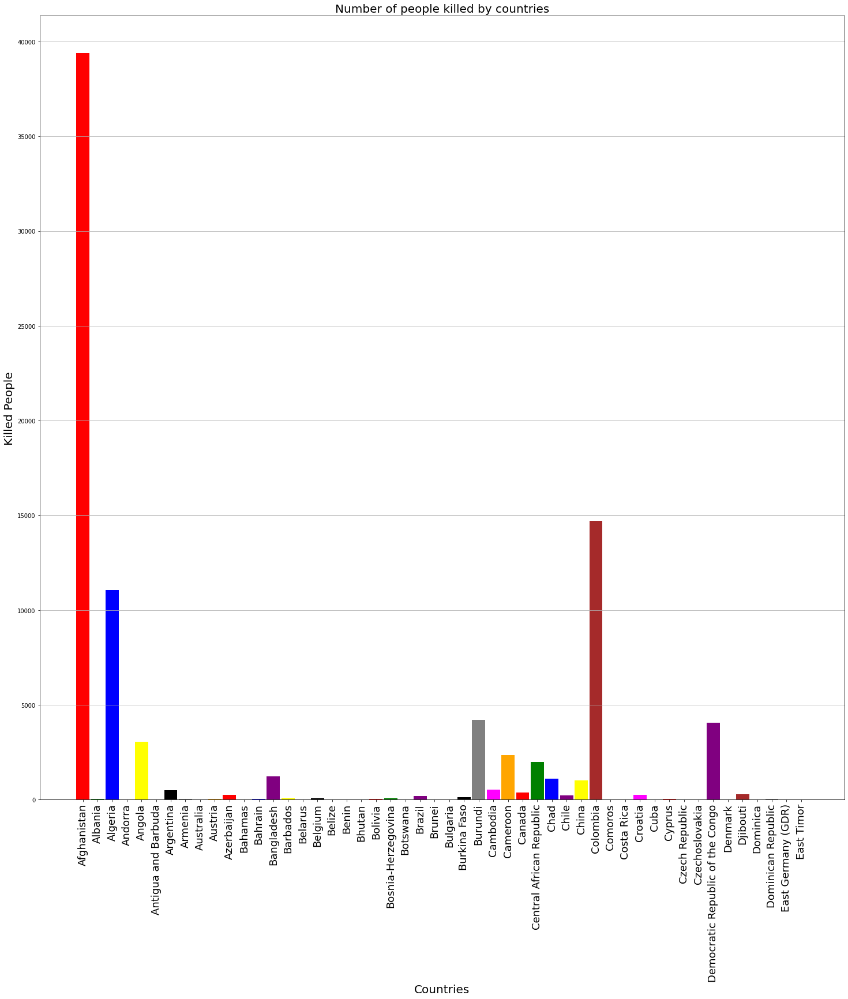

In [63]:
labels = countryKillFormatData.columns.tolist()
labels = labels[:50] #50 bar provides nice view
index = np.arange(len(labels))
transpoze = countryKillFormatData.T
values = transpoze.values.tolist()
values = values[:50]
values = [int(i[0]) for i in values] # convert float to int
colors = ['red', 'green', 'blue', 'purple', 'yellow', 'brown', 'black', 'gray', 'magenta', 'orange'] # color list for bar chart bar color 
fig, ax = plt.subplots(1, 1)
ax.yaxis.grid(True)
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=25
fig_size[1]=25
plt.rcParams["figure.figsize"] = fig_size
plt.bar(index, values, color = colors, width = 0.9)
plt.ylabel('Killed People', fontsize=20)
plt.xlabel('Countries', fontsize = 20)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize = 20)
# print(fig_size)
plt.show()

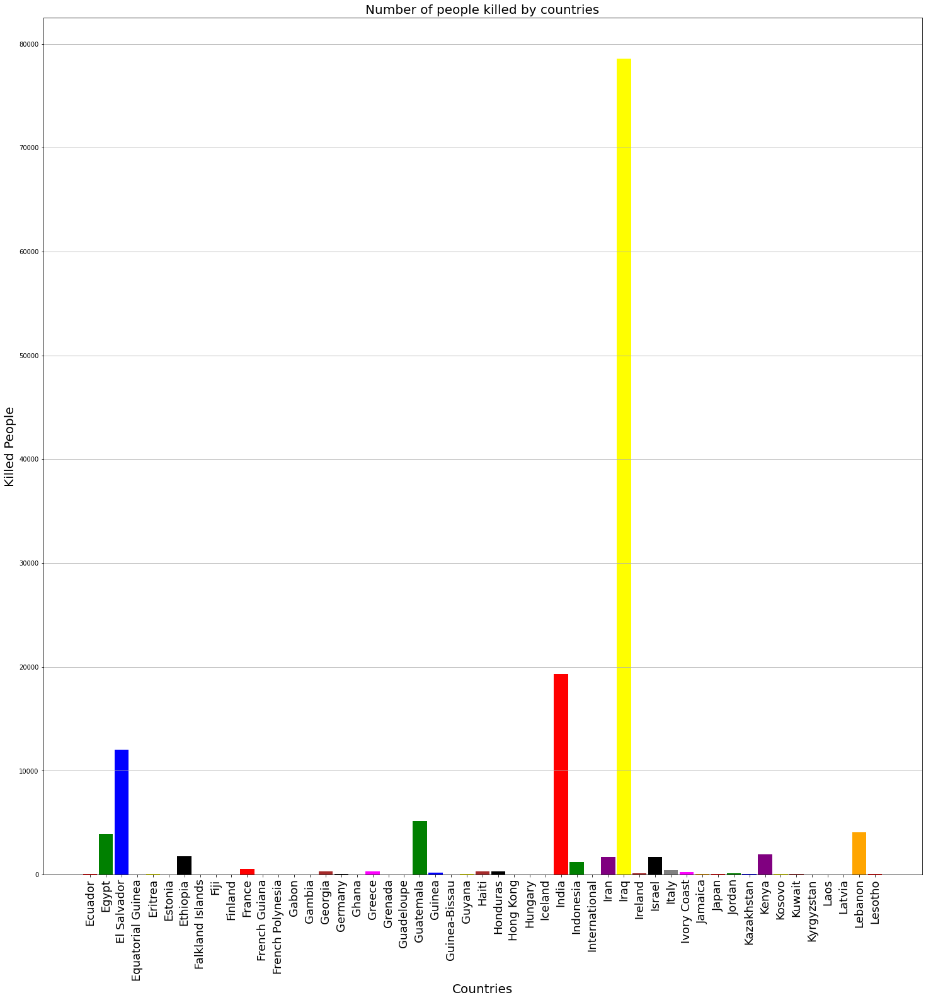

In [64]:
labels = countryKillFormatData.columns.tolist()
labels = labels[50:101]
index = np.arange(len(labels))
transpoze = countryKillFormatData.T
values = transpoze.values.tolist()
values = values[50:101]
values = [int(i[0]) for i in values]
colors = ['red', 'green', 'blue', 'purple', 'yellow', 'brown', 'black', 'gray', 'magenta', 'orange']
fig, ax = plt.subplots(1, 1)
ax.yaxis.grid(True)
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=20
fig_size[1]=20
plt.rcParams["figure.figsize"] = fig_size
plt.bar(index, values, color = colors, width = 0.9)
plt.ylabel('Killed People', fontsize=20)
plt.xlabel('Countries', fontsize = 20)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize = 20)
plt.show()

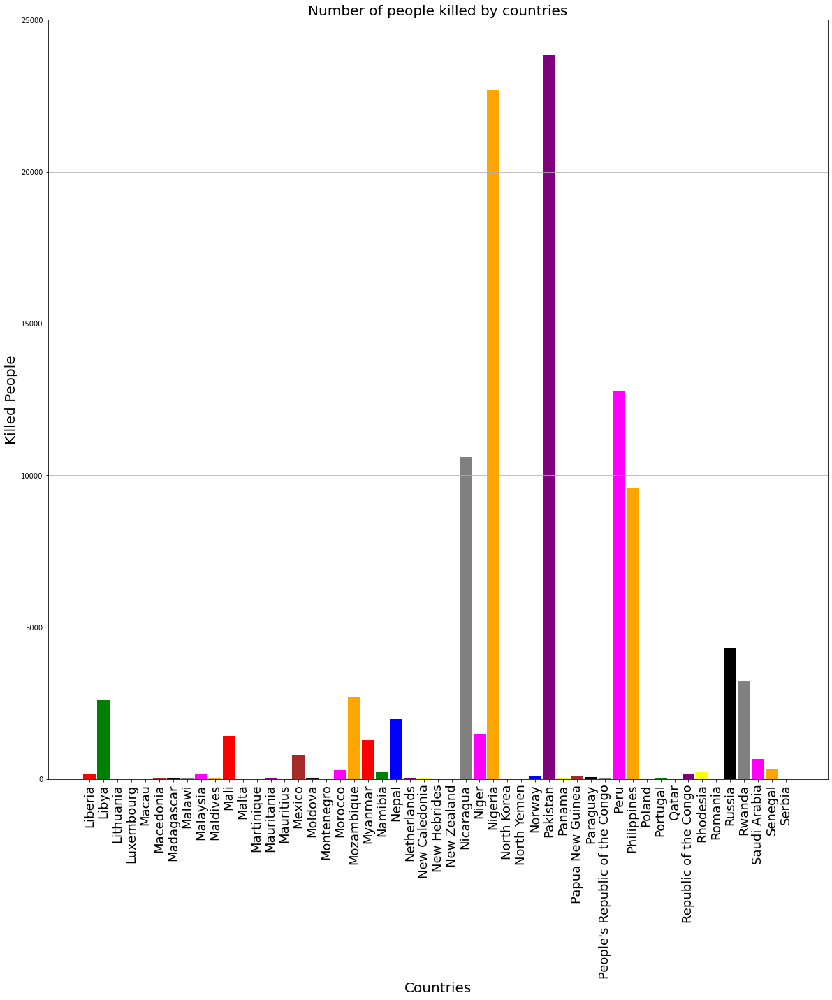

In [65]:
labels = countryKillFormatData.columns.tolist()
labels = labels[101:152]
index = np.arange(len(labels))
transpoze = countryKillFormatData.T
values = transpoze.values.tolist()
values = values[101:152]
values = [int(i[0]) for i in values]
colors = ['red', 'green', 'blue', 'purple', 'yellow', 'brown', 'black', 'gray', 'magenta', 'orange']
fig, ax = plt.subplots(1, 1)
ax.yaxis.grid(True)
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=20
fig_size[1]=20
plt.rcParams["figure.figsize"] = fig_size
plt.bar(index, values, color = colors, width = 0.9)
plt.ylabel('Killed People', fontsize=20)
plt.xlabel('Countries', fontsize = 20)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize = 20)
plt.show()

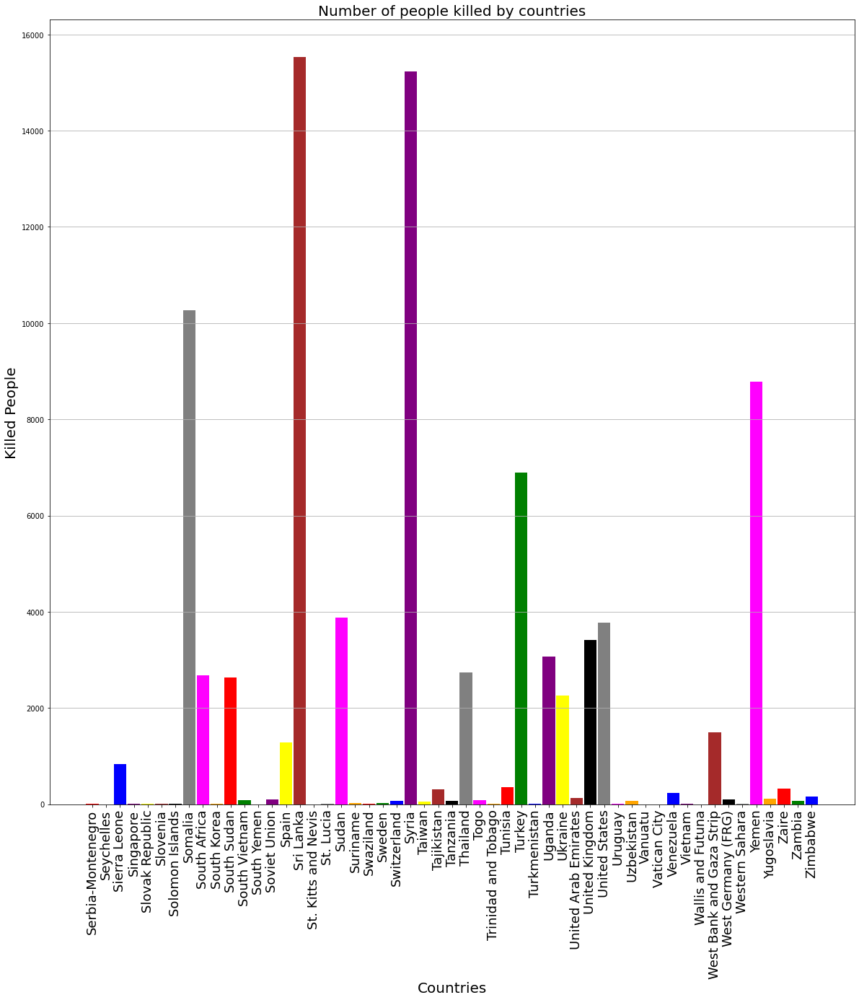

In [66]:
labels = countryKillFormatData.columns.tolist()
labels = labels[152:206]
index = np.arange(len(labels))
transpoze = countryKillFormatData.T
values = transpoze.values.tolist()
values = values[152:206]
values = [int(i[0]) for i in values]
colors = ['red', 'green', 'blue', 'purple', 'yellow', 'brown', 'black', 'gray', 'magenta', 'orange']
fig, ax = plt.subplots(1, 1)
ax.yaxis.grid(True)
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=20
fig_size[1]=20
plt.rcParams["figure.figsize"] = fig_size
plt.bar(index, values, color = colors, width = 0.9)
plt.ylabel('Killed People', fontsize=20)
plt.xlabel('Countries', fontsize = 20)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize = 20)
plt.show()

1.Terrorist acts in the Middle East and northern Africa have been seen to have fatal consequences. 

2.The Middle East and North Africa are seen to be the places of serious terrorist attacks. 

3.In addition, even though there is a perception that Muslims are supporters of terrorism, Muslims are the people who are most damaged by terrorist attacks.

4.If you look at the graphics, it appears that Iraq, Afghanistan and Pakistan are the most damaged countries. All of these countries are Muslim countries.





